In [2]:
import scanpy as sc
import pandas as pd 
import numpy as np
import anndata
import re
import h5py
import scipy.sparse as scs
import concurrent.futures
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import csc_matrix

import umap
from sklearn.preprocessing import StandardScaler
import random
from scipy.stats.stats import pearsonr
random.seed(123)
from joblib import Parallel, delayed


/tmp/ipykernel_167828/3968705939.py:16: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


In [3]:
meta_data=pd.read_csv('/home//jupyter/BRI_Analysis/scRNA/meta_data_2024-01-22_fixed.csv')
meta_data=meta_data[meta_data['Covid_exlcusion']=='no']
TimePoints=['Flu Year 1 Day 0','Flu Year 1 Day 7','Flu Year 2 Day 0','Flu Year 2 Day 7']
meta_data_subset=meta_data[meta_data['sample.visitName'].isin(TimePoints)]

In [68]:
from tqdm import tqdm
h5_list = []
for i in tqdm(range(len(meta_data_subset["pbmc_sample_id"].tolist()))):
    try:
        result = sc.read_h5ad("h5ad_flu_after_qc/"+meta_data_subset["pbmc_sample_id"].tolist()[i]+'.h5ad')
        h5_list.append(result)
        print()
    except Exception as e:
        print(f'Error reading {file_name}: {e}')

  0% 0/352 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if

  1% 2/352 [00:01<03:45,  1.55it/s]

  1% 3/352 [00:01<02:45,  2.11it/s]

  1% 4/352 [00:02<02:19,  2.50it/s]

  1% 5/352 [00:02<02:06,  2.73it/s]

  2% 6/352 [00:02<01:56,  2.97it/s]

  2% 7/352 [00:02<01:49,  3.16it/s]

  2% 8/352 [00:03<01:45,  3.26it/s]

  3% 9/352 [00:03<01:41,  3.37it/s]

  3% 10/352 [00:03<01:39,  3.42it/s]

  3% 11/352 [00:03<01:37,  3.51it/s]

  3% 12/352 [00:04<01:37,  3.50it/s]

  4% 13/352 [00:04<01:33,  3.61it/s]

  4% 14/352 [00:04<01:30,  3.73it/s]

  4% 15/352 [00:05<01:36,  3.51it/s]

  5% 16/352 [00:05<01:36,  3.49it/s]

  5% 17/352 [00:05<01:37,  3.45it/s]

  5% 18/352 [00:05<01:37,  3.42it/s]

  5% 19/352 [00:06<01:31,  3.64it/s]

  6% 20/352 [00:06<01:27,  3.78it/s]

  6% 21/352 [00:06<01:28,  3.73it/s]

  6% 22/352 [00:07<01:33,  3.54it/s]

  7% 23/352 [00:07<01:39,  3.30it/s]

  7% 24/352 [00:07<01:38,  3.34it/s]

  7% 25/352 [00:08<01:39,  3.30it/s]

  7% 26/352 [00:08<01:38,  3.32it/s]

  8% 27/352 [00:08<01:37,  3.33it/s]

  8% 28/352 [00:08<01:42,  3.17it/s]

  8% 29/352 [00:09<01:38,  3.28it/s]

  9% 30/352 [00:09<01:36,  3.33it/s]

  9% 31/352 [00:09<01:35,  3.37it/s]

  9% 32/352 [00:10<01:35,  3.36it/s]

  9% 33/352 [00:10<01:33,  3.40it/s]

 10% 34/352 [00:10<01:32,  3.44it/s]

 10% 35/352 [00:11<01:36,  3.28it/s]

 10% 36/352 [00:11<01:29,  3.54it/s]

 11% 37/352 [00:11<01:31,  3.44it/s]

 11% 38/352 [00:11<01:28,  3.55it/s]

 11% 39/352 [00:12<01:28,  3.53it/s]

 11% 40/352 [00:12<01:28,  3.51it/s]

 12% 41/352 [00:12<01:27,  3.55it/s]

 12% 42/352 [00:12<01:20,  3.84it/s]

 12% 43/352 [00:13<01:24,  3.64it/s]

 12% 44/352 [00:13<01:19,  3.85it/s]

 13% 45/352 [00:13<01:20,  3.80it/s]

 13% 46/352 [00:13<01:18,  3.89it/s]

 13% 47/352 [00:14<01:14,  4.07it/s]

 14% 48/352 [00:14<01:22,  3.70it/s]

 14% 49/352 [00:14<01:23,  3.65it/s]

 14% 50/352 [00:15<01:24,  3.58it/s]

 14% 51/352 [00:15<01:25,  3.52it/s]

 15% 52/352 [00:15<01:27,  3.43it/s]

 15% 53/352 [00:15<01:26,  3.45it/s]

 15% 54/352 [00:16<01:25,  3.50it/s]

 16% 55/352 [00:16<01:27,  3.41it/s]

 16% 56/352 [00:16<01:26,  3.42it/s]

 16% 57/352 [00:17<01:32,  3.20it/s]

 16% 58/352 [00:17<01:30,  3.26it/s]

 17% 59/352 [00:17<01:23,  3.50it/s]

 17% 60/352 [00:17<01:20,  3.64it/s]

 17% 61/352 [00:18<01:17,  3.78it/s]

 18% 62/352 [00:18<01:20,  3.59it/s]

 18% 63/352 [00:18<01:21,  3.53it/s]

 18% 64/352 [00:19<01:23,  3.45it/s]

 18% 65/352 [00:19<01:23,  3.44it/s]

 19% 66/352 [00:19<01:22,  3.47it/s]

 19% 67/352 [00:19<01:20,  3.53it/s]

 19% 68/352 [00:20<01:20,  3.55it/s]

 20% 69/352 [00:20<01:24,  3.35it/s]

 20% 70/352 [00:20<01:22,  3.40it/s]

 20% 71/352 [00:21<01:17,  3.61it/s]

 20% 72/352 [00:21<01:14,  3.78it/s]

 21% 73/352 [00:21<01:15,  3.69it/s]

 21% 74/352 [00:21<01:16,  3.61it/s]

 21% 75/352 [00:22<01:14,  3.74it/s]

 22% 76/352 [00:22<01:11,  3.87it/s]

 22% 77/352 [00:22<01:14,  3.71it/s]

 22% 78/352 [00:22<01:15,  3.61it/s]

 22% 79/352 [00:23<01:17,  3.55it/s]

 23% 80/352 [00:23<01:17,  3.50it/s]

 23% 81/352 [00:23<01:18,  3.43it/s]

 23% 82/352 [00:24<01:20,  3.36it/s]

 24% 83/352 [00:24<01:20,  3.35it/s]

 24% 84/352 [00:24<01:18,  3.43it/s]

 24% 85/352 [00:25<01:19,  3.35it/s]

 24% 86/352 [00:25<01:18,  3.38it/s]

 25% 87/352 [00:25<01:14,  3.55it/s]

 25% 89/352 [00:26<01:07,  3.90it/s]

 26% 90/352 [00:26<01:07,  3.86it/s]

 26% 91/352 [00:26<01:11,  3.66it/s]

 26% 92/352 [00:26<01:11,  3.62it/s]

 26% 93/352 [00:27<01:09,  3.71it/s]

 27% 94/352 [00:27<01:12,  3.58it/s]

 27% 95/352 [00:27<01:11,  3.59it/s]

 27% 96/352 [00:28<01:11,  3.56it/s]

 28% 97/352 [00:28<01:12,  3.50it/s]

 28% 98/352 [00:28<01:12,  3.52it/s]

 28% 99/352 [00:28<01:16,  3.33it/s]

 28% 100/352 [00:29<01:16,  3.32it/s]

 29% 101/352 [00:29<01:13,  3.41it/s]

 29% 102/352 [00:29<01:14,  3.34it/s]

 29% 103/352 [00:30<01:11,  3.47it/s]

 30% 104/352 [00:30<01:12,  3.41it/s]

 30% 105/352 [00:30<01:11,  3.47it/s]

 30% 106/352 [00:31<01:11,  3.43it/s]

 30% 107/352 [00:31<01:13,  3.34it/s]

 31% 108/352 [00:31<01:13,  3.33it/s]

 31% 109/352 [00:31<01:12,  3.36it/s]

 32% 111/352 [00:32<01:02,  3.85it/s]

 32% 112/352 [00:32<00:55,  4.30it/s]

 32% 113/352 [00:32<00:58,  4.12it/s]

 32% 114/352 [00:33<01:02,  3.79it/s]

 33% 115/352 [00:33<01:04,  3.69it/s]

 33% 116/352 [00:33<01:08,  3.46it/s]

 33% 117/352 [00:34<01:08,  3.42it/s]

 34% 119/352 [00:34<01:01,  3.81it/s]

 34% 120/352 [00:34<01:03,  3.63it/s]

 34% 121/352 [00:35<01:02,  3.69it/s]

 35% 122/352 [00:35<01:02,  3.66it/s]

 35% 123/352 [00:35<01:03,  3.61it/s]

 35% 124/352 [00:35<00:58,  3.91it/s]

 36% 125/352 [00:36<01:01,  3.69it/s]

 36% 126/352 [00:36<01:03,  3.56it/s]

 36% 127/352 [00:36<01:03,  3.55it/s]

 36% 128/352 [00:37<01:01,  3.66it/s]

 37% 129/352 [00:37<00:58,  3.80it/s]

 37% 130/352 [00:37<00:58,  3.77it/s]

 37% 131/352 [00:37<01:00,  3.64it/s]

 38% 132/352 [00:38<01:05,  3.35it/s]

 38% 133/352 [00:38<01:05,  3.34it/s]

 38% 134/352 [00:38<01:06,  3.26it/s]

 38% 135/352 [00:39<01:04,  3.36it/s]

 39% 136/352 [00:39<01:03,  3.39it/s]

 39% 137/352 [00:39<01:04,  3.32it/s]

 39% 138/352 [00:39<01:04,  3.30it/s]

 39% 139/352 [00:40<01:04,  3.30it/s]

 40% 140/352 [00:40<01:03,  3.36it/s]

 40% 141/352 [00:40<01:03,  3.35it/s]

 40% 142/352 [00:41<01:02,  3.36it/s]

 41% 143/352 [00:41<01:00,  3.46it/s]

 41% 144/352 [00:41<01:01,  3.38it/s]

 41% 146/352 [00:42<00:54,  3.75it/s]

 42% 147/352 [00:42<00:57,  3.58it/s]

 42% 148/352 [00:42<00:58,  3.47it/s]

 42% 149/352 [00:43<00:56,  3.58it/s]

 43% 150/352 [00:43<00:52,  3.88it/s]

 43% 151/352 [00:43<00:53,  3.77it/s]

 43% 152/352 [00:43<00:58,  3.40it/s]

 43% 153/352 [00:44<00:58,  3.41it/s]

 44% 154/352 [00:44<00:56,  3.49it/s]

 44% 155/352 [00:44<00:55,  3.56it/s]

 44% 156/352 [00:45<00:53,  3.64it/s]

 45% 157/352 [00:45<00:52,  3.69it/s]

 45% 158/352 [00:45<00:53,  3.66it/s]

 45% 159/352 [00:45<00:53,  3.63it/s]

 45% 160/352 [00:46<00:52,  3.68it/s]

 46% 161/352 [00:46<00:50,  3.78it/s]

 46% 162/352 [00:46<00:52,  3.62it/s]

 46% 163/352 [00:47<00:55,  3.43it/s]

 47% 164/352 [00:47<00:57,  3.26it/s]

 47% 165/352 [00:47<00:55,  3.37it/s]

 47% 166/352 [00:47<00:53,  3.48it/s]

 47% 167/352 [00:48<00:52,  3.55it/s]

 48% 168/352 [00:48<00:50,  3.66it/s]

 48% 169/352 [00:48<00:50,  3.64it/s]

 48% 170/352 [00:48<00:50,  3.62it/s]

 49% 171/352 [00:49<00:52,  3.47it/s]

 49% 172/352 [00:49<00:47,  3.76it/s]

 49% 173/352 [00:49<00:49,  3.63it/s]

 49% 174/352 [00:50<00:51,  3.43it/s]

 50% 175/352 [00:50<00:53,  3.28it/s]

 50% 176/352 [00:50<00:55,  3.19it/s]

 50% 177/352 [00:51<00:56,  3.10it/s]

 51% 178/352 [00:51<00:54,  3.19it/s]

 51% 179/352 [00:51<00:56,  3.07it/s]

 51% 180/352 [00:52<00:59,  2.88it/s]

 51% 181/352 [00:52<00:57,  2.98it/s]

 52% 182/352 [00:52<00:56,  3.03it/s]

 52% 183/352 [00:53<00:58,  2.90it/s]

 52% 184/352 [00:53<00:56,  3.00it/s]

 53% 185/352 [00:53<00:54,  3.08it/s]

 53% 186/352 [00:54<00:51,  3.19it/s]

 53% 187/352 [00:54<00:50,  3.28it/s]

 53% 188/352 [00:54<00:49,  3.31it/s]

 54% 189/352 [00:54<00:48,  3.33it/s]

 54% 190/352 [00:55<00:50,  3.24it/s]

 54% 191/352 [00:55<00:50,  3.22it/s]

 55% 192/352 [00:55<00:50,  3.18it/s]

 55% 193/352 [00:56<00:49,  3.22it/s]

 55% 194/352 [00:56<00:48,  3.28it/s]

 55% 195/352 [00:56<00:48,  3.23it/s]

 56% 196/352 [00:57<00:48,  3.24it/s]

 56% 197/352 [00:57<00:48,  3.22it/s]

 56% 198/352 [00:57<00:48,  3.15it/s]

 57% 199/352 [00:58<00:48,  3.13it/s]

 57% 200/352 [00:58<00:48,  3.15it/s]

 57% 201/352 [00:58<00:47,  3.19it/s]

 57% 202/352 [00:59<00:50,  2.97it/s]

 58% 203/352 [00:59<00:48,  3.07it/s]

 58% 204/352 [00:59<00:48,  3.08it/s]

 58% 205/352 [01:00<00:46,  3.14it/s]

 59% 206/352 [01:00<00:47,  3.10it/s]

 59% 207/352 [01:00<00:47,  3.06it/s]

 59% 208/352 [01:01<00:46,  3.09it/s]

 59% 209/352 [01:01<00:46,  3.09it/s]

 60% 210/352 [01:01<00:45,  3.10it/s]

 60% 211/352 [01:02<00:45,  3.13it/s]

 60% 212/352 [01:02<00:43,  3.21it/s]

 61% 213/352 [01:02<00:42,  3.30it/s]

 61% 214/352 [01:02<00:40,  3.37it/s]

 61% 215/352 [01:03<00:42,  3.22it/s]

 61% 216/352 [01:03<00:40,  3.37it/s]

 62% 217/352 [01:03<00:41,  3.29it/s]

 62% 218/352 [01:04<00:41,  3.25it/s]

 62% 219/352 [01:04<00:40,  3.32it/s]

 62% 220/352 [01:04<00:39,  3.32it/s]

 63% 222/352 [01:05<00:36,  3.59it/s]

 63% 223/352 [01:05<00:36,  3.57it/s]

 64% 224/352 [01:05<00:37,  3.39it/s]

 64% 225/352 [01:06<00:37,  3.37it/s]

 64% 226/352 [01:06<00:37,  3.34it/s]

 64% 227/352 [01:06<00:38,  3.28it/s]

 65% 228/352 [01:07<00:36,  3.38it/s]

 65% 229/352 [01:07<00:35,  3.45it/s]

 65% 230/352 [01:07<00:35,  3.40it/s]

 66% 231/352 [01:07<00:35,  3.36it/s]

 66% 232/352 [01:08<00:36,  3.29it/s]

 66% 233/352 [01:08<00:36,  3.27it/s]

 66% 234/352 [01:08<00:36,  3.24it/s]

 67% 235/352 [01:09<00:35,  3.28it/s]

 67% 237/352 [01:09<00:30,  3.79it/s]

 68% 238/352 [01:09<00:31,  3.60it/s]

 68% 239/352 [01:10<00:33,  3.37it/s]

 68% 241/352 [01:10<00:29,  3.77it/s]

 69% 242/352 [01:11<00:28,  3.91it/s]

 69% 244/352 [01:11<00:26,  4.06it/s]

 70% 245/352 [01:11<00:28,  3.81it/s]

 70% 246/352 [01:12<00:28,  3.75it/s]

 70% 247/352 [01:12<00:28,  3.71it/s]

 70% 248/352 [01:12<00:26,  3.92it/s]

 71% 249/352 [01:12<00:26,  3.86it/s]

 71% 251/352 [01:13<00:25,  4.04it/s]

 72% 252/352 [01:13<00:24,  4.15it/s]

 72% 253/352 [01:13<00:25,  3.86it/s]

 72% 254/352 [01:14<00:25,  3.81it/s]

 72% 255/352 [01:14<00:27,  3.54it/s]

 73% 256/352 [01:14<00:28,  3.41it/s]

 73% 257/352 [01:15<00:28,  3.29it/s]

 73% 258/352 [01:15<00:29,  3.21it/s]

 74% 259/352 [01:15<00:28,  3.22it/s]

 74% 260/352 [01:15<00:25,  3.55it/s]

 74% 261/352 [01:16<00:27,  3.33it/s]

 74% 262/352 [01:16<00:27,  3.22it/s]

 75% 263/352 [01:17<00:29,  3.06it/s]

 75% 264/352 [01:17<00:28,  3.08it/s]

 75% 265/352 [01:17<00:26,  3.28it/s]

 76% 266/352 [01:17<00:26,  3.21it/s]

 76% 267/352 [01:18<00:27,  3.11it/s]

 76% 269/352 [01:18<00:22,  3.68it/s]

 77% 270/352 [01:18<00:21,  3.76it/s]

 77% 271/352 [01:19<00:23,  3.49it/s]

 77% 272/352 [01:19<00:24,  3.28it/s]

 78% 273/352 [01:19<00:23,  3.32it/s]

 78% 274/352 [01:20<00:24,  3.20it/s]

 78% 275/352 [01:20<00:23,  3.23it/s]

 78% 276/352 [01:20<00:23,  3.24it/s]

 79% 277/352 [01:21<00:23,  3.20it/s]

 79% 278/352 [01:21<00:23,  3.14it/s]

 79% 279/352 [01:21<00:23,  3.13it/s]

 80% 280/352 [01:22<00:23,  3.11it/s]

 80% 281/352 [01:22<00:22,  3.12it/s]

 80% 282/352 [01:22<00:22,  3.13it/s]

 80% 283/352 [01:23<00:22,  3.05it/s]

 81% 285/352 [01:23<00:19,  3.51it/s]

 81% 286/352 [01:24<00:19,  3.40it/s]

 82% 287/352 [01:24<00:20,  3.19it/s]

 82% 288/352 [01:24<00:19,  3.22it/s]

 82% 289/352 [01:24<00:18,  3.32it/s]

 82% 290/352 [01:25<00:18,  3.27it/s]

 83% 291/352 [01:25<00:19,  3.15it/s]

 83% 292/352 [01:25<00:18,  3.19it/s]

 83% 293/352 [01:26<00:17,  3.39it/s]

 84% 294/352 [01:26<00:16,  3.46it/s]

 84% 295/352 [01:26<00:16,  3.37it/s]

 84% 296/352 [01:27<00:16,  3.35it/s]

 84% 297/352 [01:27<00:16,  3.25it/s]

 85% 298/352 [01:27<00:16,  3.21it/s]

 85% 299/352 [01:28<00:16,  3.28it/s]

 85% 300/352 [01:28<00:15,  3.30it/s]

 86% 301/352 [01:28<00:15,  3.19it/s]

 86% 302/352 [01:28<00:15,  3.22it/s]

 86% 303/352 [01:29<00:14,  3.45it/s]

 86% 304/352 [01:29<00:13,  3.67it/s]

 87% 305/352 [01:29<00:13,  3.47it/s]

 87% 306/352 [01:30<00:13,  3.37it/s]

 87% 307/352 [01:30<00:13,  3.23it/s]

 88% 308/352 [01:30<00:13,  3.34it/s]

 88% 309/352 [01:30<00:12,  3.35it/s]

 88% 310/352 [01:31<00:11,  3.56it/s]

 88% 311/352 [01:31<00:11,  3.69it/s]

 89% 312/352 [01:31<00:11,  3.53it/s]

 89% 313/352 [01:32<00:10,  3.76it/s]

 89% 314/352 [01:32<00:10,  3.70it/s]

 89% 315/352 [01:32<00:10,  3.61it/s]

 90% 316/352 [01:32<00:10,  3.52it/s]

 90% 317/352 [01:33<00:10,  3.44it/s]

 91% 319/352 [01:33<00:08,  3.84it/s]

 91% 320/352 [01:33<00:08,  3.67it/s]

 91% 321/352 [01:34<00:08,  3.48it/s]

 91% 322/352 [01:34<00:08,  3.68it/s]

 92% 323/352 [01:34<00:08,  3.60it/s]

 92% 324/352 [01:35<00:07,  3.54it/s]

 92% 325/352 [01:35<00:07,  3.60it/s]

 93% 326/352 [01:35<00:07,  3.49it/s]

 93% 327/352 [01:36<00:07,  3.32it/s]

 93% 328/352 [01:36<00:07,  3.29it/s]

 93% 329/352 [01:36<00:06,  3.49it/s]

 94% 330/352 [01:36<00:06,  3.42it/s]

 94% 331/352 [01:37<00:06,  3.47it/s]

 94% 332/352 [01:37<00:06,  3.25it/s]

 95% 333/352 [01:37<00:05,  3.29it/s]

 95% 334/352 [01:38<00:04,  3.62it/s]

 95% 335/352 [01:38<00:04,  3.54it/s]

 95% 336/352 [01:38<00:04,  3.44it/s]

 96% 337/352 [01:38<00:04,  3.41it/s]

 96% 338/352 [01:39<00:04,  3.45it/s]

 96% 339/352 [01:39<00:03,  3.47it/s]

 97% 340/352 [01:39<00:03,  3.35it/s]

 97% 341/352 [01:40<00:03,  3.37it/s]

 97% 342/352 [01:40<00:02,  3.44it/s]

 97% 343/352 [01:40<00:02,  3.48it/s]

 98% 344/352 [01:40<00:02,  3.46it/s]

 98% 345/352 [01:41<00:01,  3.53it/s]

 98% 346/352 [01:41<00:01,  3.41it/s]

 99% 347/352 [01:41<00:01,  3.61it/s]

 99% 348/352 [01:42<00:01,  3.59it/s]

 99% 349/352 [01:42<00:00,  3.65it/s]

 99% 350/352 [01:42<00:00,  3.56it/s]

100% 351/352 [01:42<00:00,  3.84it/s]

100% 352/352 [01:43<00:00,  3.41it/s]

In [70]:
%%time
combined= anndata.concat(h5_list)


CPU times: user 52 s, sys: 45.7 s, total: 1min 37s
Wall time: 1min 37s


In [72]:
combined.write_h5ad('flu_raw.h5ad')

In [4]:
combined=sc.read_h5ad('flu_raw.h5ad')

In [5]:
combined.obs.index=combined.obs['barcodes']

In [22]:
fitlered_gene=pd.DataFrame()
for i in combined.obs['AIFI_L3'].unique():
    print(i)
    adata_subset=combined[combined.obs['AIFI_L3']==i]
    sc.pp.filter_genes(adata_subset, min_cells=round(np.shape(adata_subset.X)[0]*0.1))
    gene_list=pd.DataFrame(list(adata_subset.var.index))
    gene_list.columns=['gene']
    gene_list['AIFI_L3']=i
    fitlered_gene=pd.concat([fitlered_gene,gene_list])


CD8 MAIT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CM CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMB- CD27+ EM CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Core naive CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Proliferating NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Core naive CD8 T cell 


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMB- CD27- EM CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMK+ CD27+ EM CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Adaptive NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


SOX4+ naive CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Proliferating T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CM CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


DN T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


KLRF1- GZMB+ CD27- EM CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMK+ Vd2 gdT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMB+ Vd2 gdT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


SOX4+ naive CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMK- CD27+ EM CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ memory CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Naive CD4 Treg


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


KLRF1- GZMB+ CD27- memory CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


KLRF1+ GZMB+ CD27- EM CD8 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ naive CD4 T cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Naive Vd1 gdT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Memory CD4 Treg


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD8aa


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


KLRB1+ memory CD4 Treg


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Memory CD8 Treg
GZMK+ memory CD4 Treg


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-

ISG+ naive CD8 T cell
CD4 MAIT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ memory CD8 T cell
KLRF1+ effector Vd1 gdT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-

ISG+ MAIT
SOX4+ Vd1 gdT


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-

KLRB1+ memory CD8 Treg
KLRF1- effector Vd1 gdT


/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: Fut

GZMK+ CD56dim NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


GZMK- CD56dim NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD56bright NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ CD56dim NK cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ILC
Core CD14 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-

pDC


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Core CD16 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD14+ cDC2


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ CD16 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Intermediate monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


C1Q+ CD16 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ CD14 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


HLA-DRhi cDC2


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


IL1B+ CD14 monocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ cDC2


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


cDC1


/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ASDC


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CMP cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Platelet


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Erythrocyte


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CLP cell
BaEoMaP cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-

Core memory B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Core naive B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD27+ effector B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Transitional B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


ISG+ naive B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Plasma cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Early memory B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD27- effector B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Type 2 polarized memory B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


CD95 memory B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Activated memory B cell


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [28]:
fitlered_gene.to_csv('filtered_gene_list.csv')

In [123]:
combined=sc.read_h5ad('flu_raw.h5ad')
combined.obs.index=combined.obs['barcodes']

In [124]:
combined=combined[combined.obs['AIFI_L3']==""]


/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [125]:
sc.pp.normalize_total(combined, target_sum=1e4)
sc.pp.log1p(combined)
sc.pp.highly_variable_genes(combined, min_mean=0.0125, max_mean=3, min_disp=0.5)
combined.raw = combined
combined = combined[:, combined.var.highly_variable]
sc.pp.scale(combined, max_value=10)
sc.tl.pca(combined, svd_solver='arpack')
sc.pp.neighbors(combined, n_neighbors=50, n_pcs=30)
sc.tl.umap(combined)

/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:215: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:842: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/opt/conda/lib/python3.10/site-packag

  0%|          | 0/500 [00:00<?, ?it/s]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs


In [126]:
meta_data_noDO=meta_data[meta_data['sample.visitName'].isin(['Flu Year 1 Day 7','Flu Year 2 Day 0','Flu Year 2 Day 7'])]

In [127]:
filtered_all=pd.DataFrame()
for i in meta_data_noDO['pbmc_sample_id']:
    print(i)
    result = pd.read_parquet("/home/jupyter/BRI_Analysis/scRNA/Labels/"+i+'_L3_decision_matrix.parquet')
    set1 = set(combined.obs['barcodes'].tolist())
    set2 = set(result['barcodes'].tolist())
    # Find intersection
    intersection = set1 & set2
    filtered=result[result['barcodes'].isin(intersection)]
    filtered_all=pd.concat([filtered_all,filtered])

PB00007-01
PB00008-01
PB00009-01
PB00011-01
PB00013-01
PB00017-01
PB00018-01
PB00019-01
PB00020-01
PB00021-01
PB00024-01
PB00027-05
PB00028-05
PB00029-02
PB00032-05
PB00033-06
PB00143-01
PB00256-01
PB00335-05
PB00336-05
PB00340-01
PB00343-01
PB00344-01
PB00348-01
PB00354-01
PB00355-01
PB00358-01
PB00359-01
PB00360-01
PB00361-01
PB00367-01
PB00370-05
PB00371-03
PB00372-01
PB00373-01
PB00374-01
PB00375-01
PB00376-01
PB00378-01
PB00379-04
PB00380-01
PB00381-01
PB00382-01
PB00385-01
PB00389-01
PB00392-01
PB00395-01
PB00396-01
PB00399-01
PB00400-01
PB00502-01
PB00503-01
PB00505-01
PB00506-01
PB00508-01
PB00509-01
PB00511-01
PB00512-01
PB00513-02
PB00515-01
PB00517-01
PB00519-01
PB00521-01
PB00522-01
PB00524-01
PB00527-01
PB00528-01
PB00531-01
PB00534-01
PB00536-01
PB00538-01
PB00540-01
PB00542-01
PB00543-01
PB00544-01
PB00546-01
PB00547-01
PB00548-01
PB00550-01
PB00551-01
PB00553-01
PB00554-01
PB00555-01
PB00556-01
PB00559-01
PB00560-01
PB00567-01
PB00570-01
PB00571-01
PB00572-01
PB00574-01

In [128]:
combined_sub=combined[filtered_all['barcodes'],]

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [129]:
combined_sub.obs=pd.concat([combined_sub.obs.reset_index(drop=True), filtered_all.iloc[:,1:72].reset_index()],axis=1)

In [158]:
combined_sub

View of AnnData object with n_obs × n_vars = 7154 × 1875
    obs: 'barcodes', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'subject.biologicalSex', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'cohort.cohortGuid', 'sample.visitName', 'sample.visitDetails', 'subject.birthYear', 'CMV.IgG.Serology.Result.Interpretation', 'BMI', 'predicted_doublet', 'doublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3', 'AIFI_L3.5', 'index', 'ASDC', 'Activated memory B cell', 'Adaptive NK cell', 'B

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


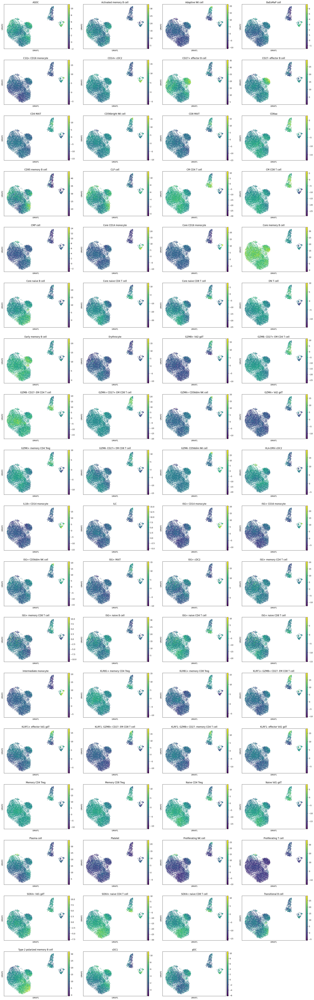

In [159]:
sc.pl.umap(combined_sub, color=['ASDC', 'Activated memory B cell', 'Adaptive NK cell',
                                'BaEoMaP cell', 'C1Q+ CD16 monocyte', 'CD14+ cDC2', 
                                'CD27+ effector B cell', 'CD27- effector B cell', 
                                'CD4 MAIT', 'CD56bright NK cell', 'CD8 MAIT', 
                                'CD8aa', 'CD95 memory B cell', 'CLP cell', 
                                'CM CD4 T cell', 'CM CD8 T cell', 'CMP cell', 
                                'Core CD14 monocyte', 'Core CD16 monocyte', 
                                'Core memory B cell', 'Core naive B cell', 
                                'Core naive CD4 T cell', 'Core naive CD8 T cell ', 
                                'DN T cell', 'Early memory B cell', 'Erythrocyte', 
                                'GZMB+ Vd2 gdT', 'GZMB- CD27+ EM CD4 T cell', 
                                'GZMB- CD27- EM CD4 T cell', 'GZMK+ CD27+ EM CD8 T cell', 
                                'GZMK+ CD56dim NK cell', 'GZMK+ Vd2 gdT', 'GZMK+ memory CD4 Treg', 
                                'GZMK- CD27+ EM CD8 T cell', 'GZMK- CD56dim NK cell', 'HLA-DRhi cDC2', 
                                'IL1B+ CD14 monocyte', 'ILC', 'ISG+ CD14 monocyte',
                                'ISG+ CD16 monocyte', 'ISG+ CD56dim NK cell', 'ISG+ MAIT',
                                'ISG+ cDC2', 'ISG+ memory CD4 T cell', 'ISG+ memory CD8 T cell',
                                'ISG+ naive B cell', 'ISG+ naive CD4 T cell', 'ISG+ naive CD8 T cell', 
                                'Intermediate monocyte', 'KLRB1+ memory CD4 Treg', 
                                'KLRB1+ memory CD8 Treg', 'KLRF1+ GZMB+ CD27- EM CD8 T cell', 
                                'KLRF1+ effector Vd1 gdT', 'KLRF1- GZMB+ CD27- EM CD8 T cell',
                                'KLRF1- GZMB+ CD27- memory CD4 T cell', 'KLRF1- effector Vd1 gdT', 
                                'Memory CD4 Treg', 'Memory CD8 Treg',
                                'Naive CD4 Treg', 'Naive Vd1 gdT', 'Plasma cell', 
                                'Platelet', 'Proliferating NK cell', 'Proliferating T cell', 
                                'SOX4+ Vd1 gdT', 'SOX4+ naive CD4 T cell', 'SOX4+ naive CD8 T cell',
                                'Transitional B cell', 'Type 2 polarized memory B cell', 'cDC1', 'pDC'])

In [164]:
data=combined_sub.X
gmm = GaussianMixture(n_components=2)
gmm.fit(data)
labels = gmm.predict(data)

GaussianMixture(n_components=2)

In [173]:
combined_sub.obs['GMM_Assignment']=labels.tolist()

/tmp/ipykernel_167828/1861546468.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  combined_sub.obs['GMM_Assignment']=labels.tolist()


/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future ve

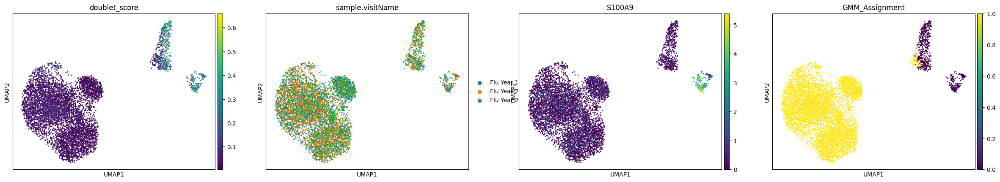

In [177]:
sc.pl.umap(combined_sub, color=['doublet_score','sample.visitName','S100A9','GMM_Assignment'])

In [133]:
mean_genes = np.mean(combined_sub.obs['CD95 memory B cell'])
std_genes = np.std(combined_sub.obs['CD95 memory B cell'])

In [147]:
cell_filter = np.logical_and(combined_sub.obs['CD95 memory B cell'] > mean_genes - 1 * std_genes, 
                             combined_sub.obs['CD95 memory B cell'] > mean_genes - 1 * std_genes)

In [148]:
cell_filter

0        True
1        True
2       False
4        True
5        True
        ...  
7445     True
7447     True
7448    False
7449     True
7450     True
Name: CD95 memory B cell, Length: 7154, dtype: bool

In [149]:
combined_sub = combined_sub[cell_filter, :]

AssertionError: Don’t call _normalize_index with non-categorical/string names

In [153]:
combined_sub.obs.index=combined_sub.obs['barcodes']

/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future ve

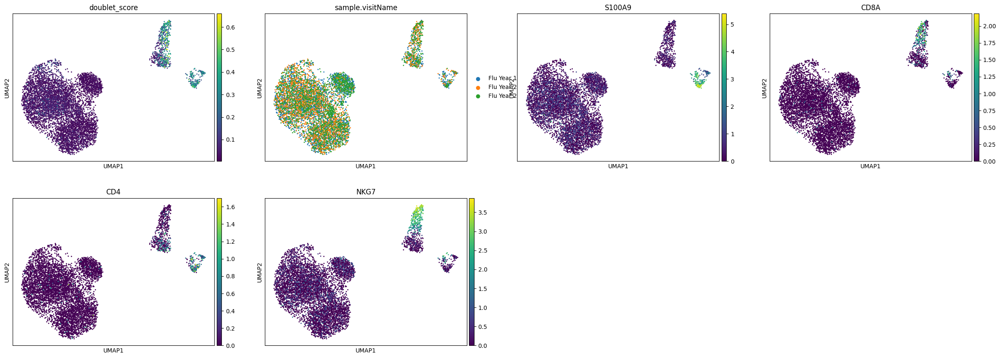

In [157]:
sc.pl.umap(combined_sub, color=['doublet_score','sample.visitName','S100A9','CD8A','CD4','NKG7'])

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='doublet_score', ylabel='Count'>

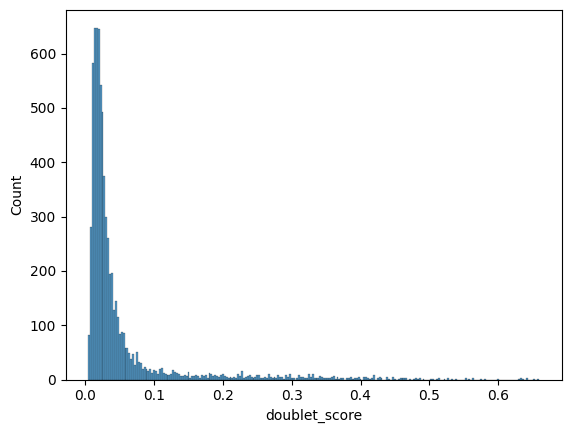

In [151]:
sns.histplot(combined_sub.obs['doublet_score'])